<a href="https://colab.research.google.com/github/IronZiiz/Domain-specific_finetunning/blob/main/Phase4_morphology_measurements.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Morphology & neuron count — ground truth vs optimized models (all folds)

This notebook implements **Methods 2.5** of the manuscript:

Cellpose-SAM (CPSAM, v4.2.1.1) — trigeminal-ganglion neuron segmentation.

Every model in `phase3_test_evaluation.json` is re-run **on its own cross-validation test fold**, with
its optimized inference parameters (`diameter`, `min_size`, `flow_threshold`, `cellprob_threshold`).
Because the five test folds partition the 26 annotated images, running all folds of one condition
covers the whole dataset exactly once. Ground-truth vs predicted masks are then compared along:

1. **Neuron count** (primary objective);
2. **Area**;
3. **Equivalent diameter**;

pooled across folds, per condition (A = no augmentation, B = with augmentation), using the same
`regionprops` pipeline / pixel→µm calibration, plus the attached mask-overlay visualization.

## 0 · Setup

In [ ]:
# Install necessary dependencies in the Colab environment
!pip install -q "cellpose==4.2.1.1" imagecodecs tifffile

In [ ]:
# Mount Google Drive
import os, shutil
try:
    from google.colab import drive
    if not os.path.ismount('/content/drive'):
        if os.path.isdir('/content/drive') and os.listdir('/content/drive'):
            shutil.rmtree('/content/drive', ignore_errors=True)
        drive.mount('/content/drive')
except ImportError:
    pass

In [ ]:
import re, json, gc, time
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io
from skimage.measure import regionprops

# Reproducibility settings
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

try:
    import torch
    torch.manual_seed(RANDOM_SEED)
    print('Torch CUDA available:', torch.cuda.is_available())
except Exception:
    torch = None

try:
    import imagecodecs
    from scipy import stats as sstats
except Exception:
    sstats = None

from cellpose import models

Torch CUDA available: True


## 1 · Configuration

In [ ]:
# General path definitions (adjust PROJECT_ROOT as needed)
PROJECT_ROOT = Path('/content/drive/MyDrive/Refactor_IA_histology')

CV_DIR = PROJECT_ROOT / 'dataset/groundtruths'
P3_TEST_JSON = PROJECT_ROOT / 'models/phase3_evaluation.json'
OUTPUT_DIR = PROJECT_ROOT / 'results/phase3_morphology'
FIG_DIR    = OUTPUT_DIR / 'figures'

if not FIG_DIR.exists():
    FIG_DIR.mkdir(parents=True, exist_ok=True)

CONDITIONS = ['A_no_augmentation', 'B_with_augmentation']

# Pixel to micrometer calibration
PX_PER_50UM      = 235.0
UM_PER_PX        = 50.0 / PX_PER_50UM
AREA_UM2_PER_PX2 = (50.0 / PX_PER_50UM) ** 2

CHANNEL_AXIS = -1
USE_GPU      = True
SAVE_OVERLAYS = False

MAIN_PROPS = ['Area_um2', 'EqDiam_um']
COND_COLOR = {'A_no_augmentation': '#0072B2', 'B_with_augmentation': '#009E73'}
COND_SHORT = {'A_no_augmentation': 'Without aug.', 'B_with_augmentation': 'With aug.'}

print(f'UM_PER_PX = {UM_PER_PX:.5f} | AREA_UM2_PER_PX2 = {AREA_UM2_PER_PX2:.6f}')

UM_PER_PX = 0.21277 | AREA_UM2_PER_PX2 = 0.045269


## 2 · Helpers

In [ ]:
def resolve_cv_pair(image_id, d):
    # Locate image and mask pairs (.npy)
    d = Path(d); img = None
    for ext in ('tif', 'tiff', 'png', 'jpg'):
        c = list(d.glob(f'{image_id}.{ext}'))
        if c: img = c[0]; break

    gt = None
    for pat in (f'{image_id}_seg.npy', f'{image_id}_masks.npy'):
        c = list(d.glob(pat))
        if c: gt = c[0]; break
    return img, gt

def load_image_rgb(path):
    img = np.asarray(io.imread(str(path)))
    if img.ndim == 2:
        img = np.stack([img] * 3, axis=-1)
    elif img.ndim == 3 and img.shape[0] in (3, 4):
        img = np.moveaxis(img, 0, -1)
    return np.ascontiguousarray(img[..., :3])

def load_masks(path):
    arr = np.load(str(path), allow_pickle=True)
    if isinstance(arr.item(), dict) and 'masks' in arr.item():
        return np.asarray(arr.item()['masks']).astype(np.int32)
    return np.asarray(arr).astype(np.int32)

def n_objects(mask):
    return int((np.unique(mask) > 0).sum())

def morphology_table(mask, condition, fold, sample_id, source):
    # Extract morphological properties via regionprops
    rows = []
    for p in regionprops(mask.astype(np.int32)):
        rows.append({
            'source': source, 'condition': condition, 'fold': fold,
            'SAMPLE_ID': sample_id, 'Neuronio': int(p.label),
            'Area_um2': p.area * AREA_UM2_PER_PX2,
            'EqDiam_um': p.equivalent_diameter * UM_PER_PX,
            'Centroid_x': float(p.centroid[1]), 'Centroid_y': float(p.centroid[0]),
        })
    return pd.DataFrame(rows)

## 3 · Run every model on its own test fold

For each entry (condition × fold) the model is loaded, run on its test images with the stored
optimized parameters, and both label sets are turned into morphology tables. Per-image object counts
(GT vs prediction) are collected in parallel.

In [ ]:
# Run inference for each fold and condition
with open(P3_TEST_JSON) as f:
    p3 = [e for e in json.load(f) if e['condition'] in CONDITIONS]
p3 = sorted(p3, key=lambda e: (e['condition'], e['fold']))

gt_frames, pred_frames, count_rows = [], [], []
overlay_store = {}

for e in p3:
    cond, fold = e['condition'], e['fold']
    ip = e['inference_parameters']

    imgs, gts, used = [], [], []
    for n in e['test_image_names']:
        ipath, gpath = resolve_cv_pair(n, CV_DIR)
        if ipath and gpath:
            imgs.append(load_image_rgb(ipath)); gts.append(load_masks(gpath)); used.append(n)

    model = models.CellposeModel(gpu=USE_GPU, pretrained_model=str(e['model_path']))

    if torch and USE_GPU: torch.cuda.synchronize()
    t0 = time.perf_counter()

    out = model.eval(imgs, diameter=ip['diameter'], flow_threshold=ip['flow_threshold'],
                     cellprob_threshold=ip['cellprob_threshold'], min_size=ip['min_size'],
                     channel_axis=CHANNEL_AXIS, normalize=True)

    if torch and USE_GPU: torch.cuda.synchronize()
    avg_time = (time.perf_counter() - t0) / len(imgs)

    preds = [np.asarray(m).astype(np.int32) for m in (out[0] if isinstance(out[0], list) else [out[0]])]

    for sid, im, g, pr in zip(used, imgs, gts, preds):
        gt_frames.append(morphology_table(g, cond, fold, sid, 'GT'))
        pf = morphology_table(pr, cond, fold, sid, 'Prediction')
        pf['segmentation_time_sec'] = avg_time
        pred_frames.append(pf)

        count_rows.append({
            'condition': cond, 'fold': fold, 'SAMPLE_ID': sid,
            'GT': n_objects(g), 'Prediction': n_objects(pr),
            'seg_time_sec': avg_time
        })
        overlay_store[(cond, fold, sid)] = (im, g, pr)

    print(f'Done: {cond} fold {fold}')
    del model; gc.collect()
    if torch: torch.cuda.empty_cache()

df_gt, df_pred = pd.concat(gt_frames), pd.concat(pred_frames)
counts = pd.DataFrame(count_rows)

# Export results
df_gt.to_csv(OUTPUT_DIR / 'morphology_gt.csv', index=False)
df_pred.to_csv(OUTPUT_DIR / 'morphology_pred.csv', index=False)
counts.to_csv(OUTPUT_DIR / 'neuron_counts.csv', index=False)

10 model(s) to run: [('A_no_augmentation', 1), ('A_no_augmentation', 2), ('A_no_augmentation', 3), ('A_no_augmentation', 4), ('A_no_augmentation', 5), ('B_with_augmentation', 1), ('B_with_augmentation', 2), ('B_with_augmentation', 3), ('B_with_augmentation', 4), ('B_with_augmentation', 5)]


/usr/local/lib/python3.12/dist-packages/cellpose/dynamics.py:524: UserWarning: Sparse invariant checks are implicitly disabled. Memory errors (e.g. SEGFAULT) will occur when operating on a sparse tensor which violates the invariants, but checks incur performance overhead. To silence this warning, explicitly opt in or out. See `torch.sparse.check_sparse_tensor_invariants.__doc__` for guidance.  (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:760.)
  coo = torch.sparse_coo_tensor(pt, torch.ones(pt.shape[1], device=pt.device, dtype=torch.int),


  A_no_augmentation fold 1: 6 images, GT=318 pred=310 (1.151s/img)
  A_no_augmentation fold 2: 5 images, GT=266 pred=327 (1.023s/img)
  A_no_augmentation fold 3: 5 images, GT=346 pred=318 (1.084s/img)
  A_no_augmentation fold 4: 5 images, GT=329 pred=382 (1.091s/img)
  A_no_augmentation fold 5: 5 images, GT=283 pred=277 (0.966s/img)
  B_with_augmentation fold 1: 6 images, GT=318 pred=310 (0.949s/img)
  B_with_augmentation fold 2: 5 images, GT=266 pred=311 (1.026s/img)
  B_with_augmentation fold 3: 5 images, GT=346 pred=362 (1.135s/img)
  B_with_augmentation fold 4: 5 images, GT=329 pred=375 (1.086s/img)
  B_with_augmentation fold 5: 5 images, GT=283 pred=293 (0.976s/img)

Total GT objects: 3084 | Total predicted objects: 3265


In [ ]:
from cellpose import metrics

with open(P3_TEST_JSON) as f:
    p3 = [e for e in json.load(f) if e['condition'] in CONDITIONS]
p3 = sorted(p3, key=lambda e: (e['condition'], e['fold']))

print(f'Running evaluation with DEFAULT (cyto) model on {len(p3)} models/folds...')

for e in p3:
    cond, fold = e['condition'], e['fold']
    ip = e['inference_parameters']
    names = [str(n) for n in e['test_image_names']]
    imgs, gts, used = [], [], []

    for n in names:
        ipath, gpath = resolve_cv_pair(n, CV_DIR)
        if ipath is None or gpath is None: continue
        imgs.append(load_image_rgb(ipath)); gts.append(load_masks(gpath)); used.append(n)

    if not imgs: continue

    # Initialize default 'cyto' model
    model = models.CellposeModel(gpu=USE_GPU)

    out = model.eval(imgs, diameter=ip['diameter'], flow_threshold=ip['flow_threshold'],
                     cellprob_threshold=ip['cellprob_threshold'], min_size=ip['min_size'],
                     channel_axis=CHANNEL_AXIS, normalize=True)

    preds = out[0] if isinstance(out[0], list) else [out[0]]
    preds = [np.asarray(m).astype(np.int32) for m in preds]

    # AP@50 calculation (IoU threshold = 0.5)
    ap, tp, fp, fn = metrics.average_precision(gts, preds, threshold=0.5)

    total_gt = sum(n_objects(g) for g in gts)
    total_pred = sum(n_objects(p) for p in preds)

    print(f'--- {COND_SHORT.get(cond, cond)} | Fold {fold} ---')
    print(f'  Count: GT={total_gt} | Pred={total_pred}')
    print(f'  Precision: AP@50 = {ap.mean():.4f}')
    print('')

    del model; gc.collect()
    if torch: torch.cuda.empty_cache()

Rodando avaliação com modelo PADRÃO (cyto) em 10 modelos/folds...


100%|██████████| 1.15G/1.15G [00:37<00:00, 33.2MB/s]


--- Without aug. | Fold 1 ---
  Contagem: GT=318 | Pred=279
  Precisão: AP@50 = 0.1510

--- Without aug. | Fold 2 ---
  Contagem: GT=266 | Pred=243
  Precisão: AP@50 = 0.0619

--- Without aug. | Fold 3 ---
  Contagem: GT=346 | Pred=262
  Precisão: AP@50 = 0.1511

--- Without aug. | Fold 4 ---
  Contagem: GT=329 | Pred=299
  Precisão: AP@50 = 0.1272

--- Without aug. | Fold 5 ---
  Contagem: GT=283 | Pred=254
  Precisão: AP@50 = 0.1537

--- With aug. | Fold 1 ---
  Contagem: GT=318 | Pred=279
  Precisão: AP@50 = 0.1510

--- With aug. | Fold 2 ---
  Contagem: GT=266 | Pred=243
  Precisão: AP@50 = 0.0619

--- With aug. | Fold 3 ---
  Contagem: GT=346 | Pred=262
  Precisão: AP@50 = 0.1511

--- With aug. | Fold 4 ---
  Contagem: GT=329 | Pred=299
  Precisão: AP@50 = 0.1272

--- With aug. | Fold 5 ---
  Contagem: GT=283 | Pred=254
  Precisão: AP@50 = 0.1537



## 4 · Neuron count (GT vs prediction, per condition)

Counts are the number of labelled objects per image, summed within each condition (each condition
covers all 26 images across its five folds).

          condition  images   GT  Prediction  avg_seg_time  mean_err  mean_abs_err  ratio_pred_gt
  A_no_augmentation      26 1542        1614         1.066     2.769         9.385          1.047
B_with_augmentation      26 1542        1651         1.031     4.192         7.885          1.071


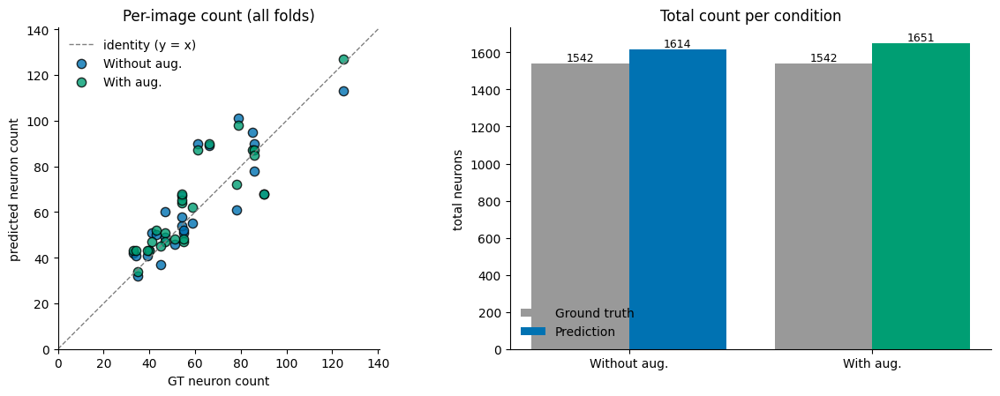

In [ ]:
counts['Pred-GT'] = counts['Prediction'] - counts['GT']
by_cond = (counts.groupby('condition')
           .agg(images=('SAMPLE_ID', 'size'),
                GT=('GT', 'sum'),
                Prediction=('Prediction', 'sum'),
                avg_seg_time=('seg_time_sec', 'mean'),
                mean_err=('Pred-GT', 'mean'),
                mean_abs_err=('Pred-GT', lambda s: s.abs().mean()))
           .reset_index())
by_cond['ratio_pred_gt'] = by_cond['Prediction'] / by_cond['GT']
pd.set_option('display.float_format', lambda x: f'{x:.3f}')
print(by_cond.to_string(index=False))

fig, ax = plt.subplots(1, 2, figsize=(12, 4.6))
lim = [0, max(counts['GT'].max(), counts['Prediction'].max()) * 1.1 + 1]
ax[0].plot(lim, lim, ls='--', color='0.5', lw=1, label='identity (y = x)')
for cond in CONDITIONS:
    sub = counts[counts.condition == cond]
    ax[0].scatter(sub['GT'], sub['Prediction'], s=55, alpha=0.8, edgecolor='black',
                  color=COND_COLOR.get(cond), label=COND_SHORT.get(cond, cond))
ax[0].set_xlim(lim); ax[0].set_ylim(lim); ax[0].set_aspect('equal')
ax[0].set_xlabel('GT neuron count'); ax[0].set_ylabel('predicted neuron count')
ax[0].set_title('Per-image count (all folds)'); ax[0].legend(frameon=False)
ax[0].spines[['top', 'right']].set_visible(False)

x = np.arange(len(by_cond)); w = 0.4
ax[1].bar(x - w/2, by_cond['GT'], width=w, label='Ground truth', color='0.6')
ax[1].bar(x + w/2, by_cond['Prediction'], width=w, label='Prediction',
          color=[COND_COLOR.get(c) for c in by_cond['condition']])
for i, (g, p) in enumerate(zip(by_cond['GT'], by_cond['Prediction'])):
    ax[1].text(i + w/2, p, f'{int(p)}', ha='center', va='bottom', fontsize=9)
    ax[1].text(i - w/2, g, f'{int(g)}', ha='center', va='bottom', fontsize=9)
ax[1].set_xticks(x); ax[1].set_xticklabels([COND_SHORT.get(c, c) for c in by_cond['condition']])
ax[1].set_ylabel('total neurons'); ax[1].set_title('Total count per condition')
ax[1].legend(frameon=False); ax[1].spines[['top', 'right']].set_visible(False)
plt.tight_layout(); plt.savefig(FIG_DIR / 'neuron_count_allfolds.png', dpi=200, bbox_inches='tight'); plt.show()

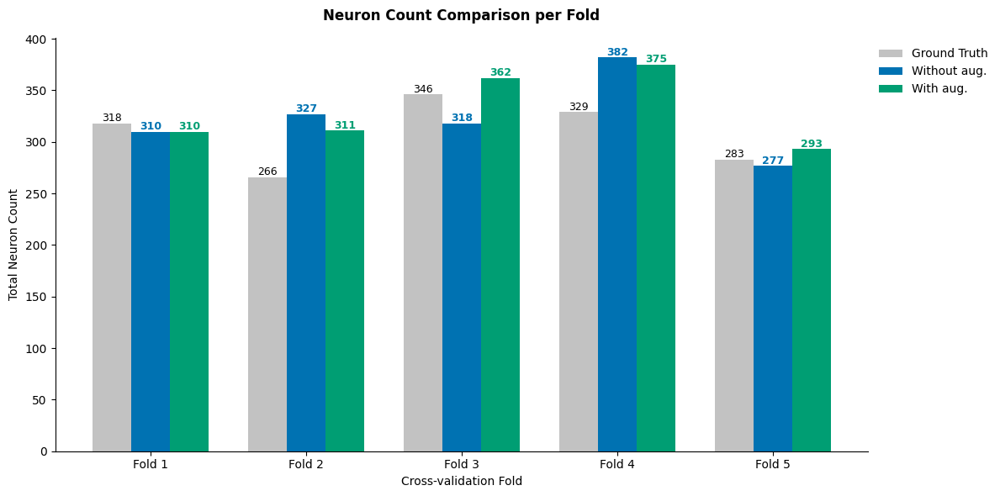

In [ ]:
# Aggregating counts per condition and fold
fold_counts = (counts.groupby(['condition', 'fold'])
               .agg({'GT': 'sum', 'Prediction': 'sum'})
               .reset_index())

folds = sorted(fold_counts['fold'].unique())
x = np.arange(len(folds))
width = 0.25

fig, ax = plt.subplots(figsize=(12, 6))

# Ground Truth bars (using a single color since GT is shared per fold)
gt_per_fold = fold_counts[fold_counts['condition'] == CONDITIONS[0]].set_index('fold')['GT']
ax.bar(x - width, gt_per_fold, width, label='Ground Truth', color='0.7', alpha=0.8)

# Condition A bars
cond_a = fold_counts[fold_counts['condition'] == CONDITIONS[0]]
ax.bar(x, cond_a['Prediction'], width, label=COND_SHORT.get(CONDITIONS[0]), color=COND_COLOR.get(CONDITIONS[0]))

# Condition B bars
cond_b = fold_counts[fold_counts['condition'] == CONDITIONS[1]]
ax.bar(x + width, cond_b['Prediction'], width, label=COND_SHORT.get(CONDITIONS[1]), color=COND_COLOR.get(CONDITIONS[1]))

# Styling
ax.set_ylabel('Total Neuron Count')
ax.set_xlabel('Cross-validation Fold')
ax.set_title('Neuron Count Comparison per Fold', fontweight='bold', pad=15)
ax.set_xticks(x)
ax.set_xticklabels([f'Fold {f}' for f in folds])
ax.legend(frameon=False, loc='upper left', bbox_to_anchor=(1, 1))
ax.spines[['top', 'right']].set_visible(False)

# Adding values on top of bars
for i, f in enumerate(folds):
    # GT label
    val_gt = gt_per_fold[f]
    ax.text(i - width, val_gt + 2, str(int(val_gt)), ha='center', fontsize=9)
    # Cond A label
    val_a = cond_a[cond_a['fold'] == f]['Prediction'].values[0]
    ax.text(i, val_a + 2, str(int(val_a)), ha='center', fontsize=9, color=COND_COLOR.get(CONDITIONS[0]), fontweight='bold')
    # Cond B label
    val_b = cond_b[cond_b['fold'] == f]['Prediction'].values[0]
    ax.text(i + width, val_b + 2, str(int(val_b)), ha='center', fontsize=9, color=COND_COLOR.get(CONDITIONS[1]), fontweight='bold')

plt.tight_layout()
plt.savefig(FIG_DIR / 'neuron_count_per_fold.png', dpi=200, bbox_inches='tight')
plt.show()

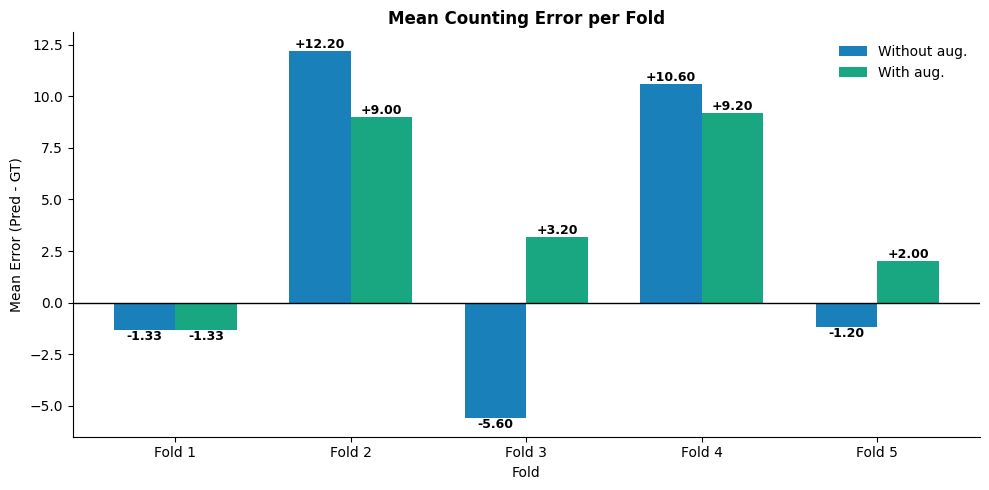

In [ ]:
# Calculate mean error per fold and condition
fold_errors = (counts.groupby(['condition', 'fold'])
               .agg(mean_error=('Pred-GT', 'mean'))
               .reset_index())

folds = sorted(fold_errors['fold'].unique())
x = np.arange(len(folds))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 5))

# Plot bars for each condition
for i, cond in enumerate(CONDITIONS):
    sub = fold_errors[fold_errors['condition'] == cond]
    offset = -width/2 if i == 0 else width/2
    ax.bar(x + offset, sub['mean_error'], width,
           label=COND_SHORT.get(cond, cond),
           color=COND_COLOR.get(cond), alpha=0.9)

# Aesthetics
ax.axhline(0, color='black', lw=1, ls='-') # Baseline zero error
ax.set_ylabel('Mean Error (Pred - GT)')
ax.set_xlabel('Fold')
ax.set_title('Mean Counting Error per Fold', fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([f'Fold {f}' for f in folds])
ax.legend(frameon=False)
ax.spines[['top', 'right']].set_visible(False)

# Add value labels
for i, cond in enumerate(CONDITIONS):
    sub = fold_errors[fold_errors['condition'] == cond]
    offset = -width/2 if i == 0 else width/2
    for j, val in enumerate(sub['mean_error']):
        va = 'bottom' if val >= 0 else 'top'
        ax.text(j + offset, val, f'{val:+.2f}', ha='center', va=va, fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(FIG_DIR / 'mean_error_per_fold.png', dpi=200, bbox_inches='tight')
plt.show()

In [ ]:
# Displaying the neuron count table per fold
display_cols = {'condition': 'Condition', 'fold': 'Fold', 'GT': 'Ground Truth', 'Prediction': 'Predicted'}
table_to_show = fold_counts.rename(columns=display_cols)

# Map conditions to short names for better readability
table_to_show['Condition'] = table_to_show['Condition'].map(COND_SHORT)

# Sorting for better organization
table_to_show = table_to_show.sort_values(['Condition', 'Fold'])

print("Neuron Count per Fold:")
display(table_to_show.reset_index(drop=True))

Contabilização de Neurônios por Fold:


,Condition,Fold,Ground Truth,Predicted
0,With aug.,1,318,310
1,With aug.,2,266,311
2,With aug.,3,346,362
3,With aug.,4,329,375
4,With aug.,5,283,293
5,Without aug.,1,318,310
6,Without aug.,2,266,327
7,Without aug.,3,346,318
8,Without aug.,4,329,382
9,Without aug.,5,283,277


## 5 · Morphology properties — area & equivalent diameter

Pooled across all folds of each condition. Predicted objects are not paired with GT objects, so the
sets are compared as distributions; the table reports n, mean ± SD, median and two non-parametric
tests (Mann–Whitney U on location, Kolmogorov–Smirnov on shape). Read effect sizes, not just p-values
(n is in the hundreds, so almost anything is 'significant').

In [ ]:
def msd(v):
    v = np.asarray(v, float); v = v[np.isfinite(v)]
    return (v.mean(), v.std(ddof=1) if v.size > 1 else 0.0, np.median(v), v.size)

def compare(props, gt, pred):
    rows = []
    for prop in props:
        g = gt[prop].dropna().values; p = pred[prop].dropna().values
        gm, gs, gmed, gn = msd(g); pm, ps, pmed, pn = msd(p)
        mw = ks = np.nan
        if sstats is not None and gn > 1 and pn > 1:
            try:
                mw = sstats.mannwhitneyu(g, p, alternative='two-sided').pvalue
                ks = sstats.ks_2samp(g, p).pvalue
            except Exception:
                pass
        rows.append({'property': prop, 'GT_mean': gm, 'GT_SD': gs, 'GT_median': gmed, 'GT_n': gn,
                     'Pred_mean': pm, 'Pred_SD': ps, 'Pred_median': pmed, 'Pred_n': pn,
                     'diff_mean(Pred-GT)': pm - gm, 'pct_diff': 100 * (pm - gm) / gm if gm else np.nan,
                     'MannWhitney_p': mw, 'KS_p': ks})
    return pd.DataFrame(rows)

pd.set_option('display.float_format', lambda x: f'{x:.4g}')
for cond in CONDITIONS:
    print(f'\n=== {COND_SHORT.get(cond, cond)} ({cond}) ===')
    display(compare(MAIN_PROPS, df_gt[df_gt.condition == cond], df_pred[df_pred.condition == cond]))

comp_all = pd.concat(
    [compare(['Area_um2', 'EqDiam_um', 'MajorAxis_um', 'MinorAxis_um', 'Perimeter_um',
              'AxisRatio', 'Eccentricity', 'Solidity', 'Extent'],
             df_gt[df_gt.condition == c], df_pred[df_pred.condition == c]).assign(condition=c)
     for c in CONDITIONS], ignore_index=True)
comp_all.to_csv(OUTPUT_DIR / 'morphology_comparison_allfolds.csv', index=False)


=== Without aug. (A_no_augmentation) ===


,property,GT_mean,GT_SD,GT_median,GT_n,Pred_mean,Pred_SD,Pred_median,Pred_n,diff_mean(Pred-GT),pct_diff,MannWhitney_p,KS_p
0,Area_um2,542.7,317.2,477.8,1542,674.9,344.6,611.5,1614,132.2,24.36,8.704e-33,1.076e-21
1,EqDiam_um,25.22,7.417,24.66,1542,28.41,7.208,27.9,1614,3.195,12.67,8.704e-33,1.076e-21



=== With aug. (B_with_augmentation) ===


,property,GT_mean,GT_SD,GT_median,GT_n,Pred_mean,Pred_SD,Pred_median,Pred_n,diff_mean(Pred-GT),pct_diff,MannWhitney_p,KS_p
0,Area_um2,542.7,317.2,477.8,1542,666.8,354.7,591.3,1651,124.1,22.86,2.092e-27,3.564e-17
1,EqDiam_um,25.22,7.417,24.66,1542,28.17,7.441,27.44,1651,2.952,11.71,2.092e-27,3.564e-17


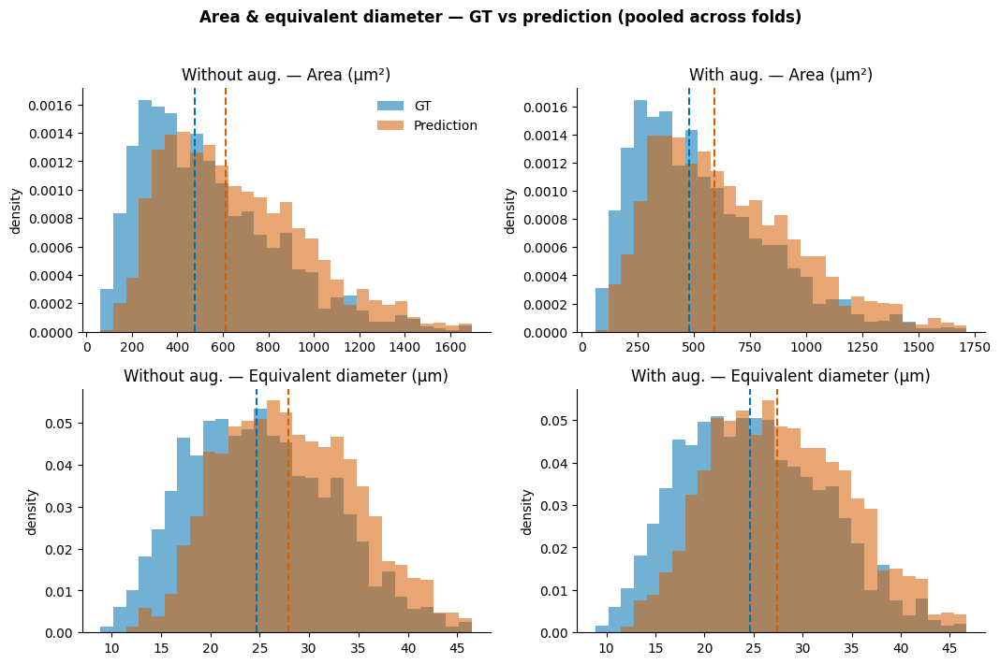

In [ ]:
LABELS = {'Area_um2': 'Area (µm²)', 'EqDiam_um': 'Equivalent diameter (µm)'}
fig, axes = plt.subplots(len(MAIN_PROPS), len(CONDITIONS),
                         figsize=(5.4 * len(CONDITIONS), 3.6 * len(MAIN_PROPS)), squeeze=False)
for i, prop in enumerate(MAIN_PROPS):
    for j, cond in enumerate(CONDITIONS):
        ax = axes[i, j]
        g = df_gt[(df_gt.condition == cond)][prop].dropna().values
        p = df_pred[(df_pred.condition == cond)][prop].dropna().values
        lo, hi = np.nanpercentile(np.concatenate([g, p]), [0, 99]); bins = np.linspace(lo, hi, 30)
        ax.hist(g, bins=bins, alpha=0.55, density=True, label='GT', color='#0072B2')
        ax.hist(p, bins=bins, alpha=0.55, density=True, label='Prediction', color='#D55E00')
        ax.axvline(np.median(g), color='#0072B2', ls='--', lw=1.5)
        ax.axvline(np.median(p), color='#D55E00', ls='--', lw=1.5)
        ax.set_title(f'{COND_SHORT.get(cond, cond)} — {LABELS.get(prop, prop)}')
        ax.set_ylabel('density'); ax.spines[['top', 'right']].set_visible(False)
        if i == 0 and j == 0:
            ax.legend(frameon=False)
fig.suptitle('Area & equivalent diameter — GT vs prediction (pooled across folds)', fontweight='bold')
plt.tight_layout(rect=(0, 0, 1, 0.96))
plt.savefig(FIG_DIR / 'morphology_area_eqdiam_allfolds.png', dpi=200, bbox_inches='tight'); plt.show()

## 6 · Visualization — masks vs ground truth (one example per fold)

Attached style (grayscale image + `mask > 0`, `alpha = 0.35`). One representative image per fold is
shown (GT left, prediction right); set `SAVE_OVERLAYS = True` in the config to also write an overlay
for every test image.

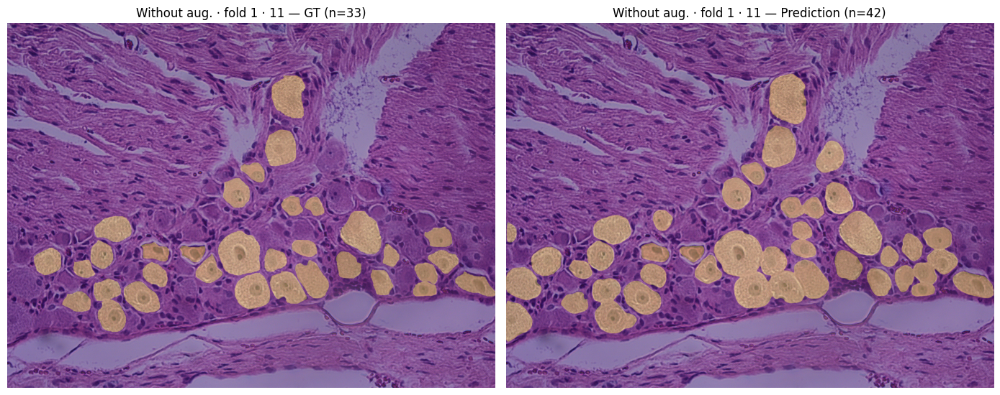

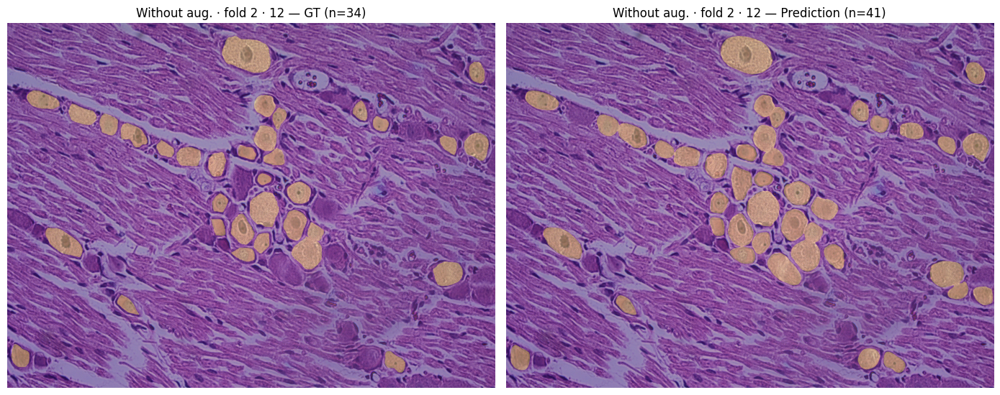

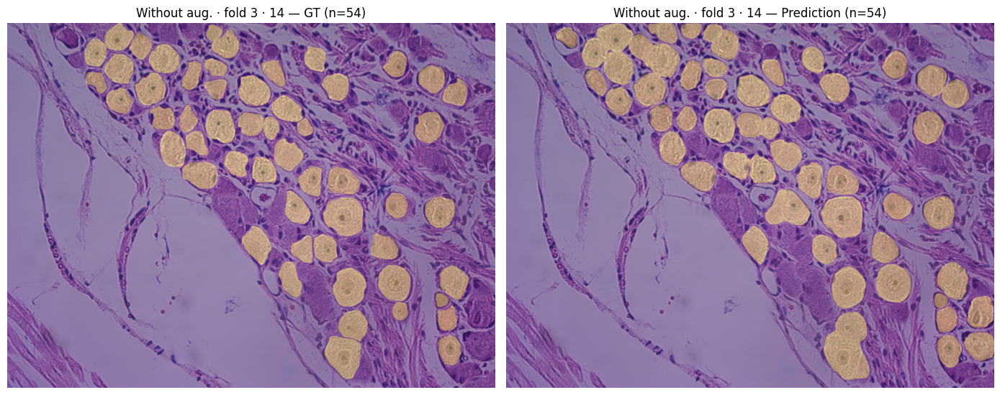

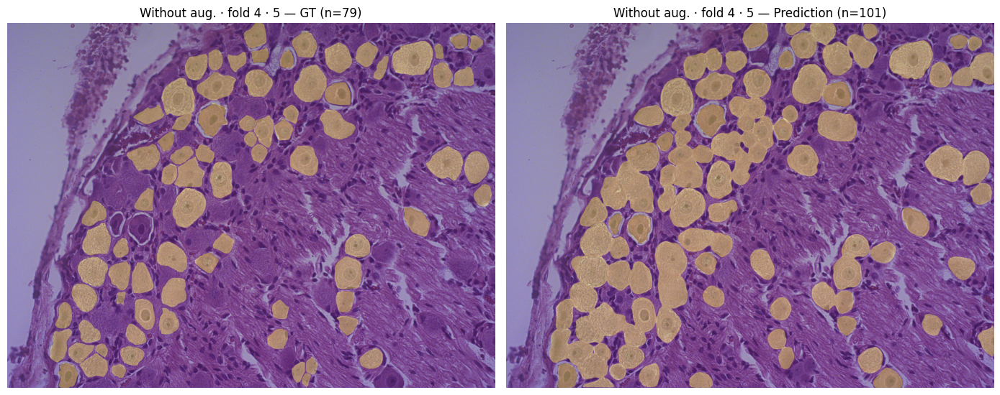

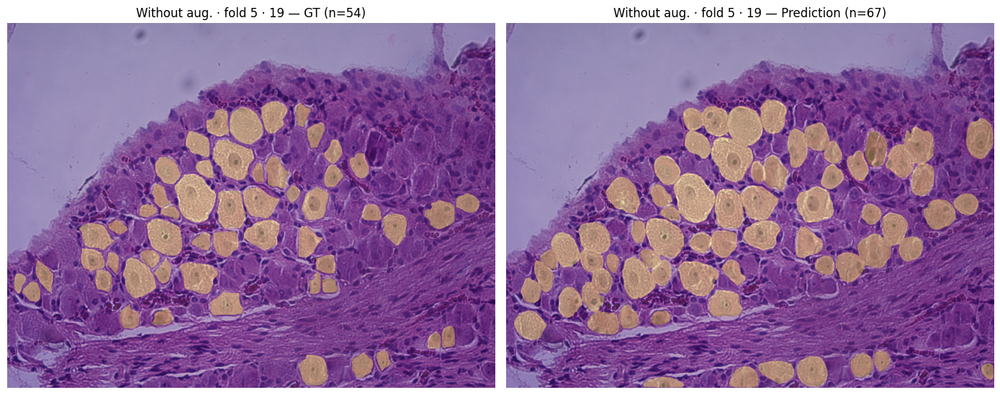

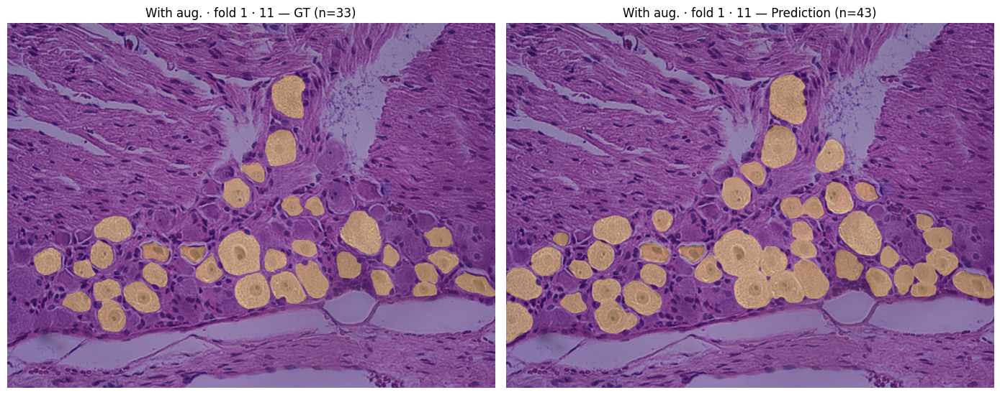

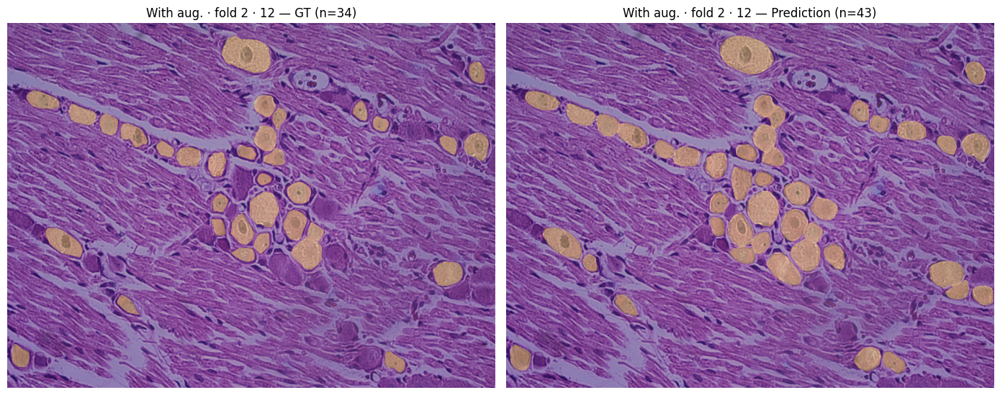

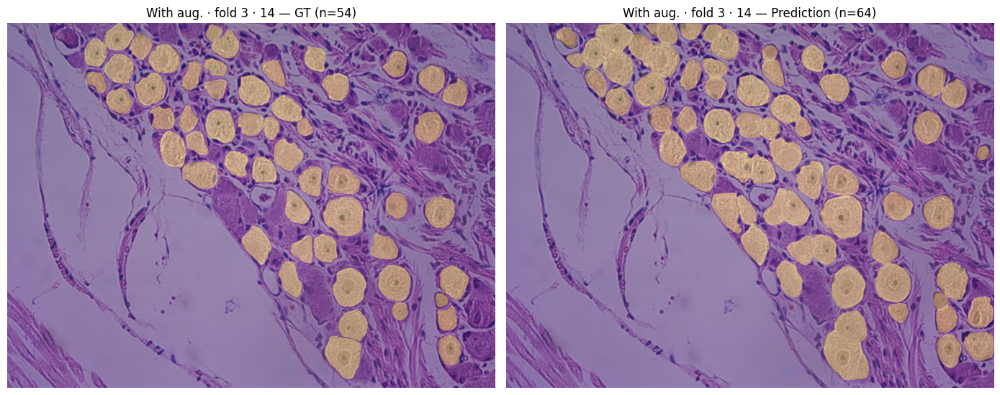

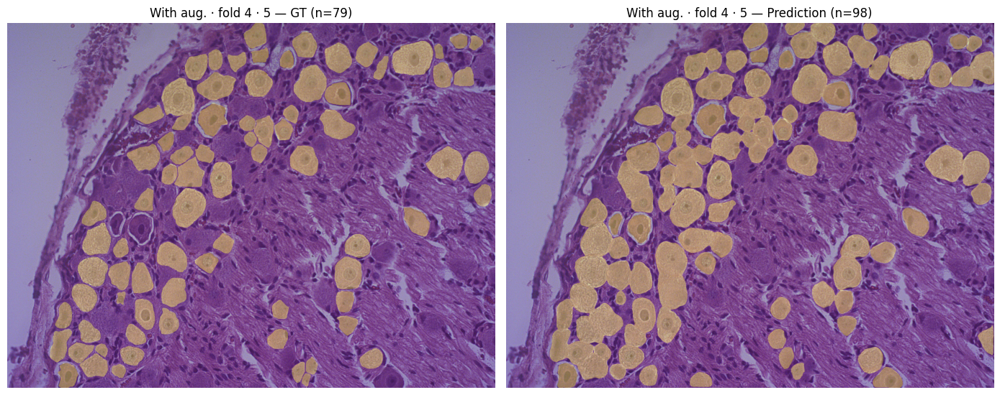

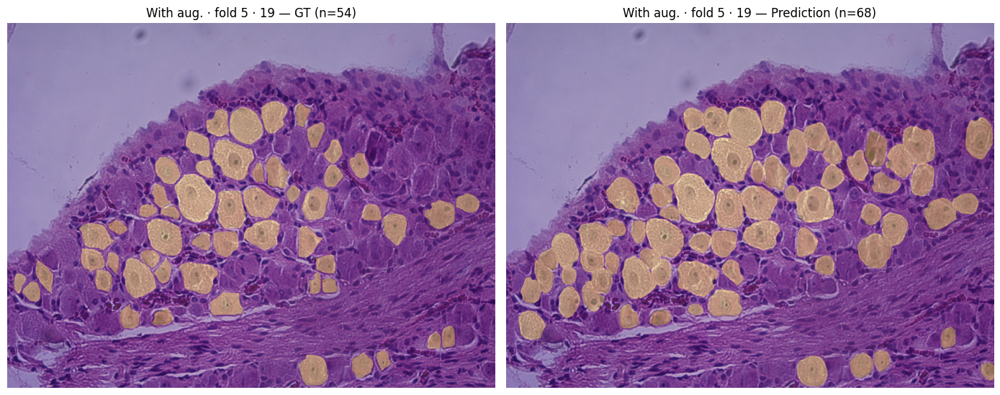

In [ ]:
shown = set()
for (cond, fold, sid), (im, g, pr) in overlay_store.items():
    first = (cond, fold) not in shown
    if first:
        shown.add((cond, fold))
    if first or SAVE_OVERLAYS:
        fig, ax = plt.subplots(1, 2, figsize=(14, 7))
        ax[0].imshow(im, cmap='gray'); ax[0].imshow(g > 0, alpha=0.35)
        ax[0].set_title(f'{COND_SHORT.get(cond, cond)} · fold {fold} · {sid} — GT (n={n_objects(g)})')
        ax[0].axis('off')
        ax[1].imshow(im, cmap='gray'); ax[1].imshow(pr > 0, alpha=0.35)
        ax[1].set_title(f'{COND_SHORT.get(cond, cond)} · fold {fold} · {sid} — Prediction (n={n_objects(pr)})')
        ax[1].axis('off')
        plt.tight_layout()
        plt.savefig(FIG_DIR / f'overlay_{cond}_fold{fold}_{sid}.png', dpi=150, bbox_inches='tight')
        if first:
            plt.show()
        else:
            plt.close(fig)

## 7 · Outputs

Saved to `OUTPUT_DIR`: `neuron_counts_allfolds.csv`, `morphology_gt_allfolds.csv`,
`morphology_pred_allfolds.csv`, `morphology_comparison_allfolds.csv`, and `figures/` (count comparison,
area & equivalent-diameter distributions, and per-fold overlays).